<h1>Solving the Transmission Problem using PTR</h1>

<h3>Code Imports</h3>

In [45]:
%matplotlib inline
import sympy as sp
import numpy as np
from  sympy import cos, sin, exp
from numpy import sqrt, log
from scipy.special import hankel1
from scipy.special import jv as besselj
from scipy.linalg import toeplitz
from matplotlib import pyplot as plt
from numpy import vectorize
from mpl_toolkits.mplot3d import Axes3D

# For testing animated plots
from plotly.offline import plot, iplot, init_notebook_mode
from plotly.graph_objs import *
init_notebook_mode()
init_notebook_mode(connected=True)
from matplotlib import animation, rc
from IPython.display import HTML

<h3>Introduction</h3>

<h3>Variable Definitions</h3>

<img src="boundary_notes.JPG" alt="Drawing" style="width: 400px;" align="left"/>

<b> Of the Boundary</b><br>
M = Number of points on the boundary<br>
J = Jacobian<br>
τ = Tangent Vector<br>
ν = Normal Vector<br>
κ = Curvature

<b> Of the PTR Approximation</b><br>
f = Function of the density<br>
k = Wave Number<br>
μ = Density of the function on boundary<br>
x, y = Range of the outer area of boundary<br>
u = Plot of the area captured by the function

<h3>Boundary Class Definition</h3>

In [46]:
class Boundary:
    '''
    Defines the class Boundary, that contains geometric features of a boundary
    
    Attributes
    ==========
    param: parametrization of a boundary
    veloc: derivative of the parametrization
    accel: second derivative of the parametrization
    normal: normal vector to the boundary
    tangent: tangent vectors to the boundary
    curvature: signed curvature of the boundary
    jacobian: Jacobian of the boundary
    '''
    
    def __init__(self, b):
        self.y = b
    
    @property
    def yp(self):
        return [sp.diff(p, t) for p in self.y]
    @property
    def ypp(self):
        return [sp.diff(p, t) for p in self.yp]
    @property
    def J(self):
        v2 = [i**2 for i in self.yp]
        sv2 = sum(v2)
        print(sv2) # This is correct ...
        return sp.sqrt(sv2)
    @property
    def τ(self):
        return [p/self.J for p in self.yp]
    @property
    def ν(self):
        if len(self.y) == 2:
            tmp = (self.yp[1]/self.J, -self.yp[0]/self.J )
            return tmp
        else:
            raise ValueError('Need to define the normal vector for higher dimensions')
    @property
    def κ(self): #curvature kappa
        if len(self.y) == 2:
            tmp = (self.yp[0]*self.ypp[1] - self.yp[1]*self.ypp[0])/self.J**3  
            return tmp
        else:
            raise ValueError('Need to define the mean curvature for higher dimensions')
            
  #  def __call__(self, u, v):             #if one needs to call the function one can create stuff
  #      print("Hello ", self.κ)
    
  # Removed .simplify() from functions, was causing a scaling error in the values for Jacobian and Kappa

<h3>Defined Boundary Curves</h3>

In [47]:
t = sp.Symbol('t')

Ellipse = (2*cos(t), 3*sin(t))
Circle = (cos(t), sin(t))
Star = ((1+0.3*cos(5*t))*cos(t), (1+0.3*cos(5*t))*sin(t))
Kite = ((cos(t) + 0.65*cos(2*t) -0.65, 1.5*sin(t)))

E = Boundary(Ellipse)
K = Boundary(Kite)
C = Boundary(Circle)
S = Boundary(Star)

<h3>Calculation of $u$ and $\frac{\partial u}{\partial \nu}$ on the Boundary</h3>

In [48]:
## Solve for the density, μ
def find_boundary_data(f, xbdy, ybdy, ν, J, κ):
    
    E_C = 0.5772156649015328606065120900824;  # Euler's constant
    N = M / 2;
    m = np.arange(1, N);

    # Create array for ifft...
    a = [0]
    a.extend(1/m)
    a.append(1/N)
    a.extend((1/m)[::-1])

    Rj = -2 * np.pi * np.fft.ifft(a);
    R = np.real(toeplitz(Rj, Rj));

    # Prepare arrays for solving integral equation of the boundary (Kress pt. 2)
    L_e = np.zeros((M, M), dtype=complex);
    M_e = np.zeros((M, M), dtype=complex);
    L_i = np.zeros((M, M), dtype=complex);
    M_i = np.zeros((M, M), dtype=complex);
    
    L1_e = np.zeros((M, M));
    L2_e = np.zeros((M, M), dtype=complex);
    M1_e = np.zeros((M, M));
    M2_e = np.zeros((M, M), dtype=complex);
    
    L1_i = np.zeros((M, M));
    L2_i = np.zeros((M, M), dtype=complex);
    M1_i = np.zeros((M, M));
    M2_i = np.zeros((M, M), dtype=complex);

    A = np.zeros((2*M, 2*M), dtype=complex);
    F = np.zeros(2*M, dtype=complex);
    for m in range(0, M):
        for n in range(0, M):
            rdiff = np.asarray([xbdy[m] - xbdy[n], ybdy[m] - ybdy[n]]);
            distance = sqrt(np.power(rdiff[:][0], 2) + np.power(rdiff[:][1], 2));
            M1_e[m][n] = -0.5 / np.pi * J[n] * besselj(0, k_e * distance);
            M1_i[m][n] = -0.5 / np.pi * J[n] * besselj(0, k_i * distance);
            if m == n:
                L1_e[m][n] = 0;
                L2_e[m][n] = 0.5 / np.pi * κ[n] * J[n];
                M2_e[m][n] = J[n] * ( 0.5 * 1j - E_C / np.pi - 0.5 / np.pi * np.log( 0.25 * np.power(k_e, 2) * np.power(J[n], 2)));
                
                L1_i[m][n] = 0;
                L2_i[m][n] = 0.5 / np.pi * κ[n] * J[n];
                M2_i[m][n] = J[n] * ( 0.5 * 1j - E_C / np.pi - 0.5 / np.pi * np.log( 0.25 * np.power(k_i, 2) * np.power(J[n], 2)));
            
            else:
                # Find a way to simplify these calculations?
                a = np.asmatrix([ν[0][n], ν[1][n]]);
                b = np.asmatrix(rdiff/distance);
                cosθ = np.asscalar(np.matmul(a, b.transpose()));
                
                logterm = log(float(4 * np.power(sin(0.5 * (m - n) * dt), 2)));
                
                L1_e[m][n] = 0.5 * k_e / np.pi * J[n] * cosθ * besselj(1, k_e * distance);
                L2_e[m][n] = 0.5 * 1j * k_e * J[n] * cosθ * hankel1(1, k_e * distance) - L1_e[m][n] * logterm;
                M2_e[m][n] = 0.5 * 1j * J[n] * hankel1(0, k_e * distance) - M1_e[m][n] * logterm;
                
                L1_i[m][n] = 0.5 * k_i / np.pi * J[n] * cosθ * besselj(1, k_i * distance);
                L2_i[m][n] = 0.5 * 1j * k_i * J[n] * cosθ * hankel1(1, k_i * distance) - L1_i[m][n] * logterm;
                M2_i[m][n] = 0.5 * 1j * J[n] * hankel1(0, k_i * distance) - M1_i[m][n] * logterm;
    
            L_e[m][n] = 0.5 * R[m][n] * (L1_e[m][n]) + 0.5 * (np.pi / N) * (L2_e[m][n]);
            M_e[m][n] = (0.5 * R[m][n] * (M1_e[m][n]) + 0.5 * (np.pi / N) * (M2_e[m][n])) * k_ratio;
            
            L_i[m][n] = 0.5 * R[m][n] * (L1_i[m][n]) + 0.5 * (np.pi / N) * (L2_i[m][n]);
            M_i[m][n] = 0.5 * R[m][n] * (M1_i[m][n]) + 0.5 * (np.pi / N) * (M2_i[m][n]);

    #Matrix from Cloaking.pdf, combined representation formulas       
    A11 = 0.5 * np.identity(M) - L_e;
    A12 = M_e;
    A21 = 0.5 * np.identity(M) + L_i;
    A22 = -M_i;

    #Combine A's into one matrix, A
    A[0:M, 0:M] = A11;
    A[0:M, M: 2*M] = A12;
    A[M: 2*M, 0:M] = A21;
    A[M: 2*M, M: 2*M] = A22;
    
    #Make matrix for f and 0's, call it F
    F[0:M] = f;
    
    #Solve for u and dvu from AU = F
        #μ_inv = np.linalg.inv(μ);
        #μ = μ_inv.dot(f);
    U = np.linalg.solve(A,F);
    u = U[0:M];
    dvu = U[M: 2*M];
    return u, dvu

<h3>Calculation of Solution Grid</h3>

In [49]:
## Preparing values for solution grid
# κappa_E = lambda u: np.array([p.subs(t,u).evalf() for p in E.κ]).T
def makegrid(ngrid, f, xbdy, ybdy, ν, J, κ):
    
    κ_max = np.amax(np.abs(κ))  # Find the absolute maximum curvature |κ|max

    dn = (1/κ_max)/ngrid;
    rgrid = np.arange(0+dn, 1/ κ_max, dn)

    # Evaluate the solutions
    x_e  = np.zeros((M + 1, ngrid - 1));
    y_e  = np.zeros((M + 1, ngrid - 1));
    v_e  = np.zeros((M + 1, ngrid - 1), dtype=complex); # Kernel and sum will include complex numbers
    exact_e  = np.zeros((M + 1, ngrid - 1), dtype=complex); # Kernel and sum will include complex numbers
    
    x_i  = np.zeros((M + 1, ngrid - 1));
    y_i  = np.zeros((M + 1, ngrid - 1));
    v_i  = np.zeros((M + 1, ngrid - 1), dtype=complex); # Kernel and sum will include complex numbers
    exact_i  = np.zeros((M + 1, ngrid - 1), dtype=complex); # Kernel and sum will include complex numbers
    
    for m in range(0, M):
        for n in range(0, ngrid - 1):
            x_e[m][n] = xbdy[m] + rgrid[n]*ν[0][m];
            y_e[m][n] = ybdy[m] + rgrid[n]*ν[1][m];

            xe_diff = x_e[m][n] - xbdy;
            ye_diff = y_e[m][n] - ybdy;
        
            distance = sqrt(np.power(xe_diff, 2) + np.power(ye_diff, 2)); #(r in kress)
            cosθ = (ν[0][:]*(x_e[m][n] - xbdy) + ν[1][:]*(y_e[m][n] - ybdy)) / distance;
            
            kernelD_e = 0.25 * 1j * (k_e * cosθ * hankel1(1, k_e*distance));
            kernelS_e = 0.25 * 1j * hankel1(0, k_e*distance); # kress (2.2+)
            #u[m][n] = np.trapz(kernel * J * μ, dx=dt);
            fx = np.exp(1j * k_e * (np.cos(alpha) * x_e[m][n] + np.sin(alpha) * y_e[m][n]));
            v_e[m][n] = fx + sum(kernelD_e * J * u)* dt - sum(kernelS_e * J * dvu) * dt; #From Representation Formula (1)
             
            exact_e[m][n] = fx;
            
            # Do the same as above but for the interior...
            
            x_i[m][n] = xbdy[m] - rgrid[n]*ν[0][m];
            y_i[m][n] = ybdy[m] - rgrid[n]*ν[1][m];
            
            xi_diff = x_i[m][n] - xbdy;
            yi_diff = y_i[m][n] - ybdy;
            
            distance = sqrt(np.power(xi_diff, 2) + np.power(yi_diff, 2)); #(r in kress)
            cosθ = (ν[0][:]*(x_i[m][n] - xbdy) + ν[1][:]*(y_i[m][n] - ybdy)) / distance;
            
            kernelD_i = 0.25 * 1j * (k_i * cosθ * hankel1(1, k_i*distance));
            kernelS_i = 0.25 * 1j * hankel1(0, k_i*distance);
            v_i[m][n] = -sum(kernelD_i * J * u) * dt + k_ratio * sum(kernelS_i * J * dvu) * dt; #From Representation Formula (2)
            
            exact_i[m][n] = np.exp(1j * k_i * (np.cos(alpha) * x_i[m][n] + np.sin(alpha) * y_i[m][n]));
    #Impose Periodicity        
    x_e[M][:] = x_e[0][:];
    y_e[M][:] = y_e[0][:];
    v_e[M][:] = v_e[0][:];
    exact_e[M][:] = exact_e[0][:];
    x_i[M][:] = x_i[0][:];
    y_i[M][:] = y_i[0][:];
    v_i[M][:] = v_i[0][:];
    exact_i[M][:] = exact_i[0][:];
    return x_e, y_e, v_e, exact_e, x_i, y_i, v_i, exact_i

<h3>PTR Approximation</h3>

In [50]:
# Create functions to evaluate dirichlet data
bdy_E = sp.lambdify(t, E.y);
ν_E = sp.lambdify(t, E.ν);
J_E = sp.lambdify(t, E.J);
κ_E = sp.lambdify(t, E.κ);

bdy_K = sp.lambdify(t, K.y);
ν_K = sp.lambdify(t, K.ν);
J_K = sp.lambdify(t, K.J);
κ_K = sp.lambdify(t, K.κ);

bdy_C = sp.lambdify(t, C.y);
ν_C = sp.lambdify(t, C.ν);
J_C = sp.lambdify(t, C.J);
κ_C = sp.lambdify(t, C.κ);

bdy_S = sp.lambdify(t, S.y);
ν_S = sp.lambdify(t, S.ν);
J_S = sp.lambdify(t, S.J);
κ_S = sp.lambdify(t, S.κ);

4*sin(t)**2 + 9*cos(t)**2
4*sin(t)**2 + 9*cos(t)**2
4*sin(t)**2 + 9*cos(t)**2
4*sin(t)**2 + 9*cos(t)**2
(-sin(t) - 1.3*sin(2*t))**2 + 2.25*cos(t)**2
(-sin(t) - 1.3*sin(2*t))**2 + 2.25*cos(t)**2
(-sin(t) - 1.3*sin(2*t))**2 + 2.25*cos(t)**2
(-sin(t) - 1.3*sin(2*t))**2 + 2.25*cos(t)**2
sin(t)**2 + cos(t)**2
sin(t)**2 + cos(t)**2
sin(t)**2 + cos(t)**2
sin(t)**2 + cos(t)**2
(-(0.3*cos(5*t) + 1)*sin(t) - 1.5*sin(5*t)*cos(t))**2 + ((0.3*cos(5*t) + 1)*cos(t) - 1.5*sin(t)*sin(5*t))**2
(-(0.3*cos(5*t) + 1)*sin(t) - 1.5*sin(5*t)*cos(t))**2 + ((0.3*cos(5*t) + 1)*cos(t) - 1.5*sin(t)*sin(5*t))**2
(-(0.3*cos(5*t) + 1)*sin(t) - 1.5*sin(5*t)*cos(t))**2 + ((0.3*cos(5*t) + 1)*cos(t) - 1.5*sin(t)*sin(5*t))**2
(-(0.3*cos(5*t) + 1)*sin(t) - 1.5*sin(5*t)*cos(t))**2 + ((0.3*cos(5*t) + 1)*cos(t) - 1.5*sin(t)*sin(5*t))**2


In [51]:
# Evaluate solution to hemholtz from boundary data
def def_f(bdy, x0, y0):
    xbdy = bdy[0][:];
    ybdy = bdy[1][:];

    #dist = sqrt(np.power(xbdy - x0, 2) + np.power(ybdy - y0, 2));

    # f = np.exp(1j * k * xbdy);
    f = np.exp(1j * k_e * (np.cos(alpha) * xbdy + np.sin(alpha) * ybdy));
    # f = np.cos(k * xbdy);
    # f = np.sin(k * xbdy);
    # f = 0.25 * 1j * hankel1(0, k * dist);  # Fundamental solution, Φ
    return xbdy, ybdy, f

In [52]:
# USER INPUTS:  M (number of points on boundary) and k (wave number)
M = 300
k_e = 2
k_i = 2
k_ratio = k_e/k_i
alpha = np.pi / 5;

x0 = 0;
y0 = 0;

dt = 2.0 * np.pi/(M);
θ = np.arange(0, 2* np.pi, dt);

In [53]:
xbdyE, ybdyE, fE = def_f(bdy_E(θ), x0, y0);
#fig, ax  = plt.subplots(1,1)
#ax.plot(np.real(fE), 'b', label='Real')
#ax.plot(np.imag(fE), 'r--', label='Imaginary')
#ax.legend(loc='upper right');
#fig.suptitle('Solution f of Ellipse Boundary');

In [54]:
ngrid = 99;
u, dvu = find_boundary_data(fE, xbdyE, ybdyE, ν_E(θ), J_E(θ), κ_E(θ));
x_e, y_e, v_e, exact_e, x_i, y_i, v_i, exact_i = makegrid(ngrid, fE, xbdyE, ybdyE, ν_E(θ), J_E(θ), κ_E(θ));

In [55]:
#Combine results.... 
    #Currently seperable so could identify whether issue is arising in exterior or interior calculation of transmission

x = np.zeros((2 * (M + 1), ngrid - 1));
y  = np.zeros((2 * (M + 1), ngrid - 1));
v  = np.zeros((2 * (M + 1), ngrid - 1), dtype=complex); # Kernel and sum will include complex numbers
exact  = np.zeros((2 * (M + 1), ngrid - 1), dtype=complex); # Kernel and sum will include complex numbers

x[0:M+1][:] = x_i;
x[M+1:2 * (M+1)] = x_e;
y[0:M+1][:] = y_i;
y[M+1:2 * (M+1)] = y_e;
v[0:M+1][:] = v_i;
v[M+1:2 * (M+1)] = v_e;
exact[0:M+1][:] = exact_i;
exact[M+1:2 * (M+1)] = exact_e;

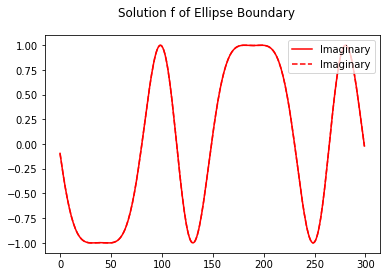

In [56]:
fig, ax  = plt.subplots(1,1)
#ax.plot(np.real(fE), 'b', label='Real')
ax.plot(np.imag(fE), 'r', label='Imaginary')
#ax.plot(np.real(u), 'b--', label='Real')
ax.plot(np.imag(u), 'r--', label='Imaginary')
ax.legend(loc='upper right');
fig.suptitle('Solution f of Ellipse Boundary');

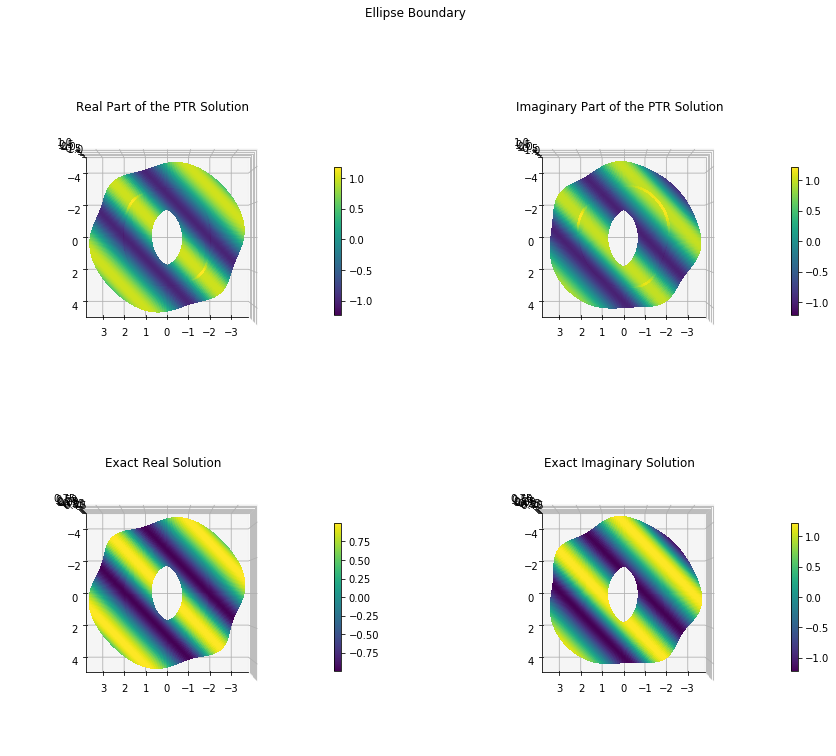

In [57]:
fig = plt.figure(figsize=(15,12))
fig.suptitle("Ellipse Boundary");
ax = fig.add_subplot(2 ,2 ,1, projection='3d')
#fig.gca(projection='3d')
ax.view_init(90,90)
real1 = ax.plot_surface(x, y, np.real(v), rstride=1, cstride=1, cmap=plt.get_cmap('viridis'), linewidth=0, antialiased=False)
plt.title("Real Part of the PTR Solution");
fig.colorbar(real1, shrink=0.5);


#fig = plt.figure(figsize=(10,7))
#ax = fig.gca(projection='3d')
ax = fig.add_subplot(2, 2, 2, projection='3d')
ax.view_init(90,90)
imag1 = ax.plot_surface(x, y, np.imag(v), rstride=1, cstride=1, cmap=plt.get_cmap('viridis'), linewidth=0, antialiased=False)
plt.title("Imaginary Part of the PTR Solution");
fig.colorbar(imag1, shrink=0.5);
#plt.show()

ax = fig.add_subplot(2, 2, 3, projection='3d')
ax.view_init(90,90)
real1 = ax.plot_surface(x, y, np.real(exact), rstride=1, cstride=1, cmap=plt.get_cmap('viridis'), linewidth=0, antialiased=False)
plt.title("Exact Real Solution");
fig.colorbar(real1, shrink=0.5);

ax = fig.add_subplot(2, 2, 4, projection='3d')
ax.view_init(90,90)
imag = ax.plot_surface(x, y, np.imag(exact), rstride=1, cstride=1, cmap=plt.get_cmap('viridis'), linewidth=0, antialiased=False)
plt.title("Exact Imaginary Solution");
fig.colorbar(imag1, shrink=0.5);




<h3>Error Plot</h3>

In [58]:
data= [Surface(x=x, y=y, z=log(np.absolute((v) - (exact))))]

layout=dict(xaxis=dict(zeroline=False),
            yaxis=dict(zeroline=False),
            width=700,
            height=700,
            margin=dict(l=50, r=50, b=100, t=100),
           title='Log Error Plot', hovermode='closest'
           )
          
figure1=dict(data=data, layout=layout)          
iplot(figure1)

<h3>Issues (Resolved and Unresolved)</h3>
<ul>
        <li>Exterior and Interior results have extreme error in comparison to exterior results.  Exterior seems to be off by some factor, and interior has weird behavior.  Compare to seperate notebooks for Interior and Exterior Representation - <b>UNRESOLVED</b></li> 
</ul>